# Space Debris Detection — Multi-YOLO Model Comparison

Trains **YOLOv8n, YOLOv8s, YOLOv9c, YOLO11s** on your Roboflow dataset, evaluates each on the held-out test set, and produces comparison charts.



## Cell 1 — Check GPU

In [1]:
import subprocess
result = subprocess.run(["nvidia-smi"], capture_output=True, text=True)
print(result.stdout if result.returncode == 0 else "No GPU found — switch runtime to GPU!")

Sat May  9 00:55:55 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   32C    P0             43W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

## Cell 2 — Install Dependencies

In [2]:
!pip install ultralytics roboflow -q
!pip install matplotlib seaborn pandas numpy -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 80.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.9/207.9 kB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 51.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 87.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 141.5 MB/s eta 0:00:00


## Cell 3 — Download Dataset from Roboflow

Fill in your **API key**, **workspace**, **project name**, and **version number**.
Find these at: `roboflow.com > your project > Export > YOLOv8`.

In [3]:
from roboflow import Roboflow

ROBOFLOW_API_KEY = "LtfcKA2nz8FFUtqx9ExS"   # <-- paste your key
WORKSPACE_NAME   = "jannat-javed-nqvnt"      # <-- e.g. "janna-workspace"
PROJECT_NAME     = "space-debris-4l7uc"   # <-- e.g. "space-debris-detection"
VERSION_NUMBER   = 1                     # <-- version you want to use

rf = Roboflow(api_key=ROBOFLOW_API_KEY)
project = rf.workspace(WORKSPACE_NAME).project(PROJECT_NAME)
dataset = project.version(VERSION_NUMBER).download("yolov8")

DATASET_PATH = dataset.location
print("Dataset downloaded to:", DATASET_PATH)

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Space-Debris-1 in yolov8:: 100%|██████████| 28805/28805 [00:04<00:00, 6834.58it/s] 


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Dataset downloaded to: /content/Space-Debris-1


## Cell 4 — Verify Dataset Structure

In [4]:
import os
import yaml
from pathlib import Path

data_yaml = Path(DATASET_PATH) / "data.yaml"
with open(data_yaml) as f:
    cfg = yaml.safe_load(f)

print("Classes :", cfg.get("names"))
print("NC      :", cfg.get("nc"))
print("Train   :", cfg.get("train"))
print("Val     :", cfg.get("val"))
print("Test    :", cfg.get("test"))

for split in ["train", "valid", "test"]:
    img_dir = Path(DATASET_PATH) / split / "images"
    if img_dir.exists():
        count = len(list(img_dir.glob("*.*")))
        print(f"  {split}: {count} images")

Classes : ['Space-Debris']
NC      : 1
Train   : ../train/images
Val     : ../valid/images
Test    : ../test/images
  train: 12600 images
  valid: 1200 images
  test: 600 images


## Cell 5 — Training Configuration

Shared hyper-parameters chosen to **prevent overfitting**:
- `patience=20` — early stopping
- `weight_decay=0.0005` — L2 regularisation
- `dropout=0.1` — classifier head dropout
- `cos_lr=True` — cosine LR schedule
- `close_mosaic=15` — disables mosaic for last 15 epochs to stabilise training

In [5]:
COMMON_ARGS = dict(
    data         = str(data_yaml),
    epochs       = 100,
    imgsz        = 512,
    batch        = 64,          # lower to 8 if you get OOM errors
    patience     = 20,          # early stopping
    weight_decay = 0.0005,
    dropout      = 0.1,
    cos_lr       = True,
    close_mosaic = 15,
    augment      = True,
    cache        = True,       # set True if RAM > 16 GB
    device       = 0,           # GPU 0
    workers      = 4,
    verbose      = True,
)

MODELS = {
    "YOLOv8n": "yolov8n.pt",   # nano  — fastest, least params
    "YOLOv8s": "yolov8s.pt",   # small — good accuracy/speed tradeoff
    "YOLOv9c": "yolov9c.pt",   # compact — improved gradient flow
    "YOLO11s": "yolo11s.pt",   # latest Ultralytics architecture
}

print("Will train:", list(MODELS.keys()))
print("Shared config:", COMMON_ARGS)

Will train: ['YOLOv8n', 'YOLOv8s', 'YOLOv9c', 'YOLO11s']
Shared config: {'data': '/content/Space-Debris-1/data.yaml', 'epochs': 100, 'imgsz': 512, 'batch': 64, 'patience': 20, 'weight_decay': 0.0005, 'dropout': 0.1, 'cos_lr': True, 'close_mosaic': 15, 'augment': True, 'cache': True, 'device': 0, 'workers': 4, 'verbose': True}


## Cell 6 — Train All Models

Each model trains sequentially.

In [6]:
from ultralytics import YOLO
import time

results_summary = {}

for model_name, weights in MODELS.items():
    print(f"\n{'='*60}")
    print(f"  Training {model_name}  ({weights})")
    print(f"{'='*60}")

    model = YOLO(weights)

    t0 = time.time()
    train_result = model.train(
        **COMMON_ARGS,
        name=f"debris_{model_name}",
        project="debris_runs",
    )
    elapsed = (time.time() - t0) / 60

    metrics = {
        "model"          : model_name,
        "weights"        : weights,
        "train_time_min" : round(elapsed, 1),
        "mAP50"          : round(train_result.results_dict.get("metrics/mAP50(B)",    0), 4),
        "mAP50_95"       : round(train_result.results_dict.get("metrics/mAP50-95(B)", 0), 4),
        "precision"      : round(train_result.results_dict.get("metrics/precision(B)",0), 4),
        "recall"         : round(train_result.results_dict.get("metrics/recall(B)",   0), 4),
        "best_weights"   : str(train_result.save_dir / "weights" / "best.pt"),
    }
    results_summary[model_name] = metrics
    print(f"\n  {model_name} done in {elapsed:.1f} min | mAP50={metrics['mAP50']} | mAP50-95={metrics['mAP50_95']}")

print("\nAll models trained.")


  Training YOLOv8n  (yolov8n.pt)
Ultralytics 8.4.48 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=64, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=15, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/Space-Debris-1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.1, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=debris_YOLOv8n, nbs=64, nms=False, opset=None, optimize=

## Cell 7 — Validation Metrics Table

In [7]:
import pandas as pd

df = pd.DataFrame(list(results_summary.values()))
df = df.sort_values("mAP50_95", ascending=False).reset_index(drop=True)
df.index += 1
display_cols = ["model", "mAP50", "mAP50_95", "precision", "recall", "train_time_min"]
display(df[display_cols])

,model,mAP50,mAP50_95,precision,recall,train_time_min
1,YOLOv9c,0.9466,0.5279,0.9346,0.9099,148.8
2,YOLOv8s,0.9429,0.5269,0.9346,0.9111,65.9
3,YOLO11s,0.9420,0.5260,0.9347,0.9029,90.3
4,YOLOv8n,0.9397,0.5247,0.9405,0.9024,68.7


## Cell 8 — Test Set Evaluation

Runs each trained model on the **held-out test set** (600 images, never seen during training or validation).

In [8]:
test_results = {}

for model_name, info in results_summary.items():
    print(f"\nEvaluating {model_name} on test set ...")
    model = YOLO(info["best_weights"])
    val = model.val(
        data    = str(data_yaml),
        split   = "test",
        imgsz   = 512,
        batch   = 16,
        device  = 0,
        verbose = False,
        name    = f"test_{model_name}",
        project = "debris_runs",
    )
    test_results[model_name] = {
        "test_mAP50"    : round(val.results_dict.get("metrics/mAP50(B)",    0), 4),
        "test_mAP50_95" : round(val.results_dict.get("metrics/mAP50-95(B)", 0), 4),
        "test_precision": round(val.results_dict.get("metrics/precision(B)",0), 4),
        "test_recall"   : round(val.results_dict.get("metrics/recall(B)",   0), 4),
    }
    print(f"  {model_name}: mAP50={test_results[model_name]['test_mAP50']} | "
          f"mAP50-95={test_results[model_name]['test_mAP50_95']}")

df_test = pd.DataFrame([
    {**{"model": k}, **v}
    for k, v in test_results.items()
]).sort_values("test_mAP50_95", ascending=False).reset_index(drop=True)
df_test.index += 1
print("\n=== Test Set Results ===")
display(df_test)


Evaluating YOLOv8n on test set ...
Ultralytics 8.4.48 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2329.7±725.6 MB/s, size: 85.6 KB)
val: Scanning /content/Space-Debris-1/test/labels... 600 images, 195 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 600/600 1.7Kit/s 0.4s
val: New cache created: /content/Space-Debris-1/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 38/38 12.7it/s 3.0s
                   all        600        599      0.936      0.883      0.922      0.506
Speed: 0.6ms preprocess, 0.8ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /content/runs/detect/debris_runs/test_YOLOv8n
  YOLOv8n: mAP50=0.9225 | mAP50-95=0.5057

Evaluating YOLOv8s on test set ...
Ultralytics 8.4.48 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NV

,model,test_mAP50,test_mAP50_95,test_precision,test_recall
1,YOLOv8s,0.9322,0.5102,0.9471,0.8975
2,YOLOv9c,0.9304,0.5066,0.9437,0.8957
3,YOLO11s,0.9227,0.5060,0.9226,0.8956
4,YOLOv8n,0.9225,0.5057,0.9363,0.8832


## Cell 9 — Overfitting Check

Compares validation mAP50 vs test mAP50. A gap **> 0.05** is flagged as potential overfitting.

In [9]:
print("\n=== Overfitting Check (val mAP50 vs test mAP50) ===")
print(f"{'Model':<12} {'Val mAP50':>10} {'Test mAP50':>11} {'Gap':>8}")
print("-" * 44)
for m in results_summary:
    val_map  = results_summary[m]["mAP50"]
    test_map = test_results[m]["test_mAP50"]
    gap      = round(val_map - test_map, 4)
    flag     = " *** OVERFIT?" if gap > 0.05 else ""
    print(f"{m:<12} {val_map:>10} {test_map:>11} {gap:>8}{flag}")


=== Overfitting Check (val mAP50 vs test mAP50) ===
Model         Val mAP50  Test mAP50      Gap
--------------------------------------------
YOLOv8n          0.9397      0.9225   0.0172
YOLOv8s          0.9429      0.9322   0.0107
YOLOv9c          0.9466      0.9304   0.0162
YOLO11s           0.942      0.9227   0.0193


## Cell 10 — Comparison Charts

Three figures:
1. mAP@0.5 and mAP@0.5:0.95 (val vs test)
2. Precision & Recall on test set
3. Training loss + mAP curves per model

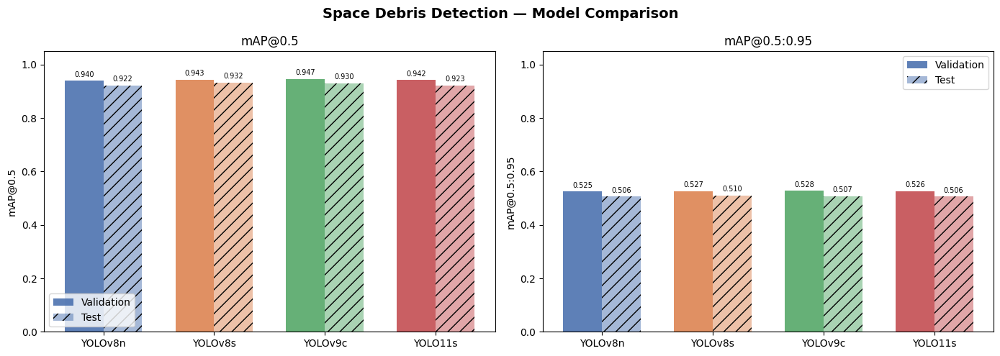

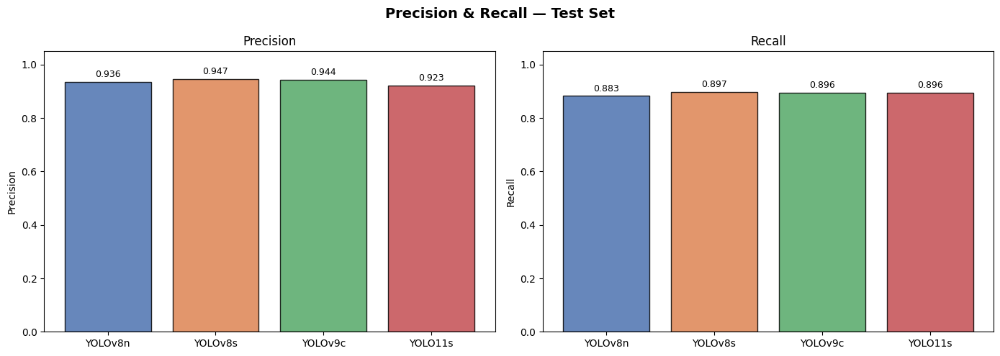

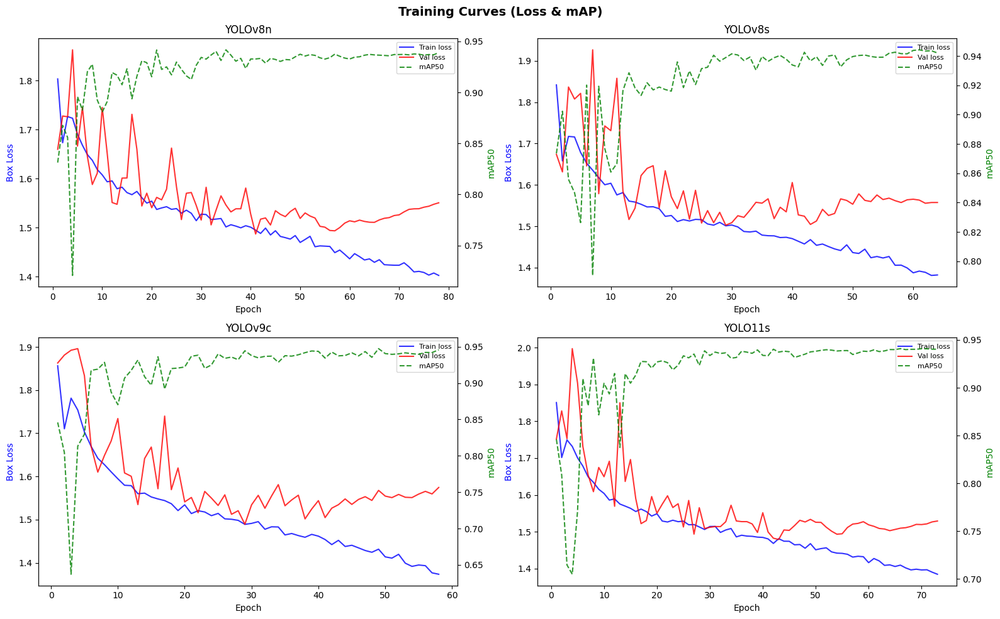

In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

model_names = list(results_summary.keys())
colors      = ["#4C72B0", "#DD8452", "#55A868", "#C44E52"]

# --- Figure 1: mAP bar chart ---
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("Space Debris Detection — Model Comparison", fontsize=14, fontweight="bold")

metrics_to_plot = [
    ("mAP50",    "mAP@0.5",       "test_mAP50",    "mAP@0.5 (Test)"),
    ("mAP50_95", "mAP@0.5:0.95",  "test_mAP50_95", "mAP@0.5:0.95 (Test)"),
]

for ax, (val_key, val_label, test_key, _) in zip(axes, metrics_to_plot):
    x     = np.arange(len(model_names))
    width = 0.35
    vals  = [results_summary[m][val_key]  for m in model_names]
    tests = [test_results[m][test_key]    for m in model_names]
    b1 = ax.bar(x - width/2, vals,  width, label="Validation", color=colors, alpha=0.9)
    b2 = ax.bar(x + width/2, tests, width, label="Test",        color=colors, alpha=0.5, hatch="//")
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, fontsize=10)
    ax.set_ylabel(val_label)
    ax.set_title(val_label)
    ax.set_ylim(0, 1.05)
    ax.legend()
    for bar in list(b1) + list(b2):
        h = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, h + 0.01, f"{h:.3f}",
                ha="center", va="bottom", fontsize=7)

plt.tight_layout()
plt.savefig("comparison_map.png", dpi=150, bbox_inches="tight")
plt.show()

# --- Figure 2: Precision & Recall ---
fig2, axes2 = plt.subplots(1, 2, figsize=(14, 5))
fig2.suptitle("Precision & Recall — Test Set", fontsize=14, fontweight="bold")

for ax, (key, title) in zip(axes2, [("test_precision","Precision"),("test_recall","Recall")]):
    vals = [test_results[m][key] for m in model_names]
    bars = ax.bar(model_names, vals, color=colors, alpha=0.85, edgecolor="black")
    ax.set_ylim(0, 1.05)
    ax.set_title(title)
    ax.set_ylabel(title)
    for bar in bars:
        h = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, h + 0.01, f"{h:.3f}",
                ha="center", va="bottom", fontsize=9)

plt.tight_layout()
plt.savefig("comparison_precision_recall.png", dpi=150, bbox_inches="tight")
plt.show()

# --- Figure 3: Training curves ---
fig3, axes3 = plt.subplots(2, 2, figsize=(16, 10))
fig3.suptitle("Training Curves (Loss & mAP)", fontsize=14, fontweight="bold")
axes3 = axes3.flatten()

for idx, (model_name, info) in enumerate(results_summary.items()):
    run_dir  = Path(info["best_weights"]).parent.parent
    csv_path = run_dir / "results.csv"
    if not csv_path.exists():
        axes3[idx].set_title(f"{model_name} — results.csv not found")
        continue

    df_curve = pd.read_csv(csv_path)
    df_curve.columns = df_curve.columns.str.strip()

    ax  = axes3[idx]
    ax2 = ax.twinx()

    if "train/box_loss" in df_curve.columns:
        ax.plot(df_curve["epoch"], df_curve["train/box_loss"], "b-",  label="Train loss", alpha=0.8)
    if "val/box_loss" in df_curve.columns:
        ax.plot(df_curve["epoch"], df_curve["val/box_loss"],   "r-",  label="Val loss",   alpha=0.8)
    if "metrics/mAP50(B)" in df_curve.columns:
        ax2.plot(df_curve["epoch"], df_curve["metrics/mAP50(B)"], "g--", label="mAP50", alpha=0.8)

    ax.set_xlabel("Epoch")
    ax.set_ylabel("Box Loss", color="blue")
    ax2.set_ylabel("mAP50", color="green")
    ax.set_title(model_name)
    lines1, labels1 = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax.legend(lines1 + lines2, labels1 + labels2, loc="upper right", fontsize=8)

plt.tight_layout()
plt.savefig("training_curves.png", dpi=150, bbox_inches="tight")
plt.show()

## Cell 11 — Visualise Predictions on Test Images

Shows random test-set predictions for the **best-performing model**. Uncomment the loop at the bottom to see all models.


Showing predictions for best model: YOLOv8s


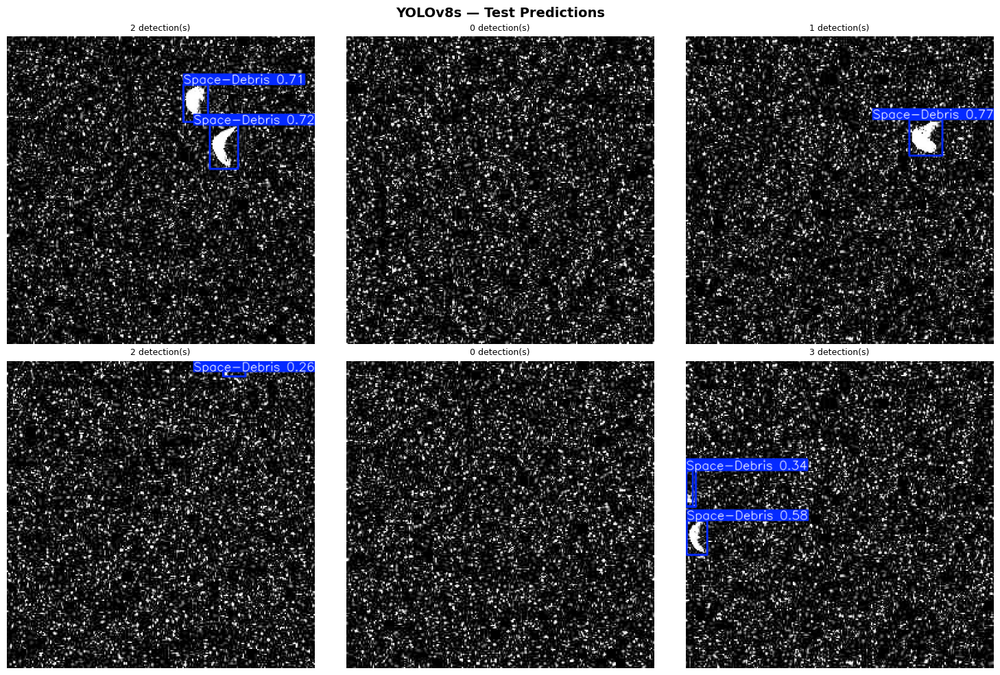

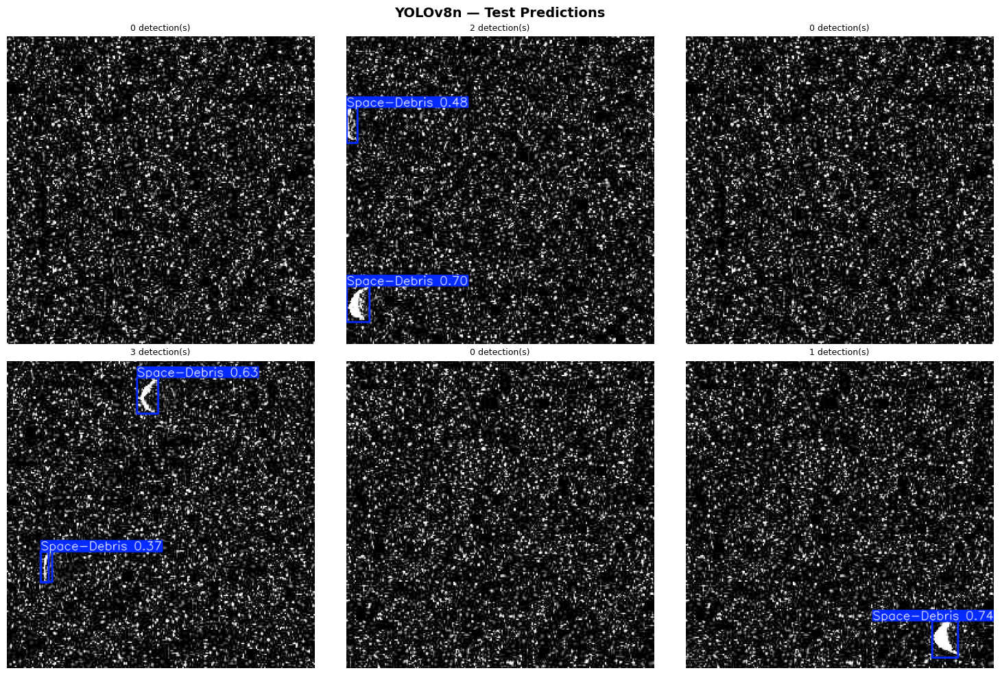

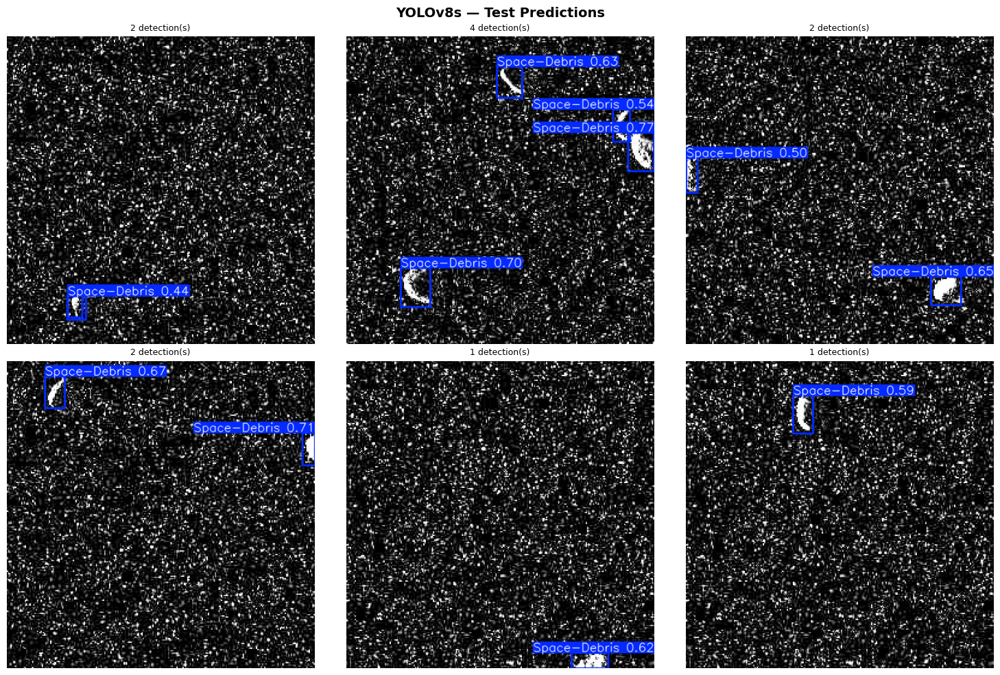

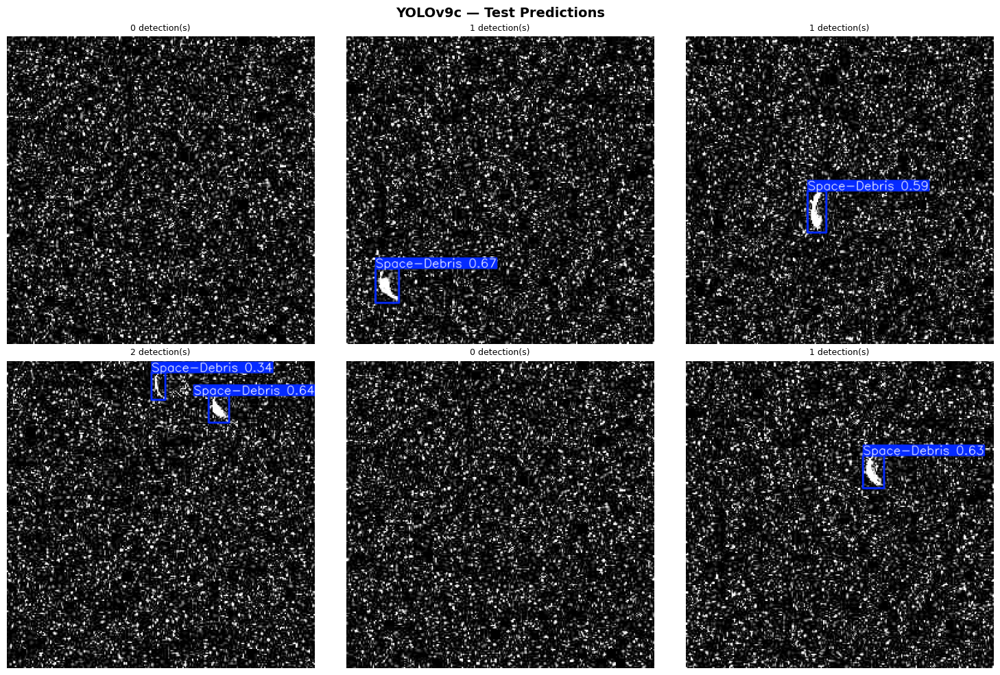

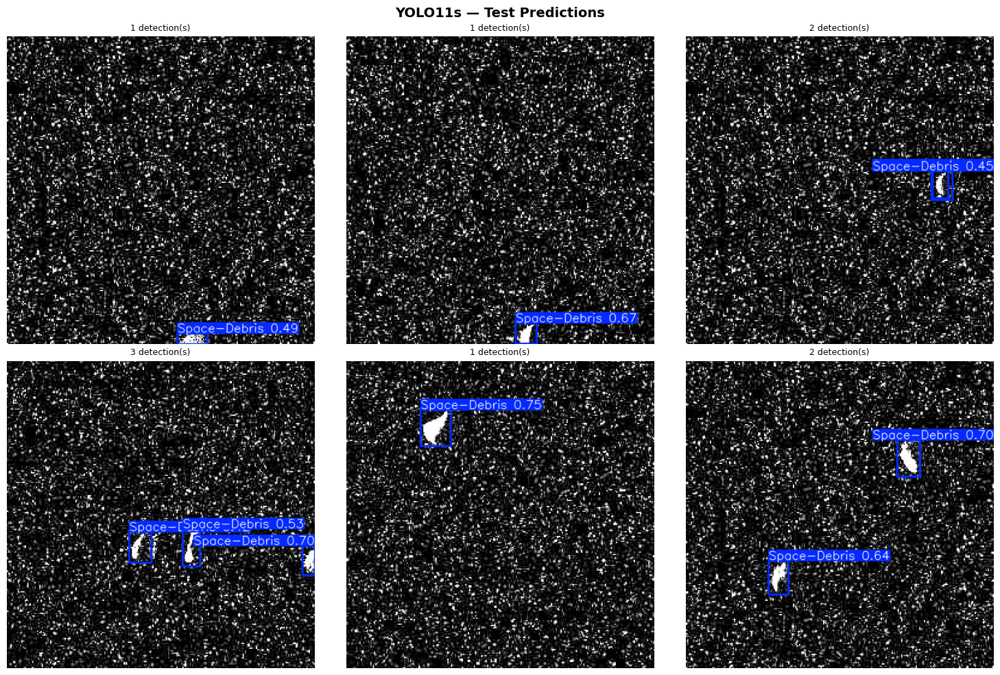

In [13]:
import random
from PIL import Image

def show_predictions(model_name, info, n_images=6):
    model    = YOLO(info["best_weights"])
    test_dir = Path(DATASET_PATH) / "test" / "images"
    images   = list(test_dir.glob("*.*"))
    if not images:
        print("No test images found."); return

    sample  = random.sample(images, min(n_images, len(images)))
    results = model.predict(source=sample, imgsz=512, conf=0.25, verbose=False)

    cols = 3
    rows = (len(sample) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))
    fig.suptitle(f"{model_name} — Test Predictions", fontsize=14, fontweight="bold")
    axes = axes.flatten() if rows > 1 else axes

    for ax, r in zip(axes, results):
        img = r.plot()[:, :, ::-1]   # BGR -> RGB
        ax.imshow(img)
        ax.axis("off")
        n_det = len(r.boxes) if r.boxes else 0
        ax.set_title(f"{n_det} detection(s)", fontsize=9)

    for ax in axes[len(results):]:
        ax.axis("off")

    plt.tight_layout()
    plt.savefig(f"predictions_{model_name}.png", dpi=120, bbox_inches="tight")
    plt.show()

best_model_name = max(test_results, key=lambda m: test_results[m]["test_mAP50_95"])
print(f"\nShowing predictions for best model: {best_model_name}")
show_predictions(best_model_name, results_summary[best_model_name])

# Uncomment to see predictions for all models:
for m, info in results_summary.items():
  show_predictions(m, info)

## Cell 12 — Final Summary Table

In [14]:
print("\n" + "="*65)
print("  FINAL COMPARISON SUMMARY — Space Debris Detection")
print("="*65)

combined = []
for m in model_names:
    combined.append({
        "Model"         : m,
        "Val mAP50"     : results_summary[m]["mAP50"],
        "Val mAP50-95"  : results_summary[m]["mAP50_95"],
        "Test mAP50"    : test_results[m]["test_mAP50"],
        "Test mAP50-95" : test_results[m]["test_mAP50_95"],
        "Precision"     : test_results[m]["test_precision"],
        "Recall"        : test_results[m]["test_recall"],
        "Train (min)"   : results_summary[m]["train_time_min"],
        "Overfit Gap"   : round(results_summary[m]["mAP50"] - test_results[m]["test_mAP50"], 4),
    })

df_final = (pd.DataFrame(combined)
              .sort_values("Test mAP50-95", ascending=False)
              .reset_index(drop=True))
df_final.index += 1
display(df_final)

print(f"\n>>> Best model: {best_model_name}")
print(f"    Weights saved at: {results_summary[best_model_name]['best_weights']}")
print(f"\nSaved charts: comparison_map.png, comparison_precision_recall.png, training_curves.png")


  FINAL COMPARISON SUMMARY — Space Debris Detection


,Model,Val mAP50,Val mAP50-95,Test mAP50,Test mAP50-95,Precision,Recall,Train (min),Overfit Gap
1,YOLOv8s,0.9429,0.5269,0.9322,0.5102,0.9471,0.8975,65.9,0.0107
2,YOLOv9c,0.9466,0.5279,0.9304,0.5066,0.9437,0.8957,148.8,0.0162
3,YOLO11s,0.9420,0.5260,0.9227,0.5060,0.9226,0.8956,90.3,0.0193
4,YOLOv8n,0.9397,0.5247,0.9225,0.5057,0.9363,0.8832,68.7,0.0172



>>> Best model: YOLOv8s
    Weights saved at: /content/runs/detect/debris_runs/debris_YOLOv8s/weights/best.pt

Saved charts: comparison_map.png, comparison_precision_recall.png, training_curves.png
